<a href="https://colab.research.google.com/github/Rohanpratap14/Human_Actitvity_Detection/blob/main/Minor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORTING LIBRARIES

In [1]:
import os
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

# from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model



# Mounted at /content/drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls

drive  sample_data


In [ ]:
!find /content/ -name "*.zip"


# VISUALISATION

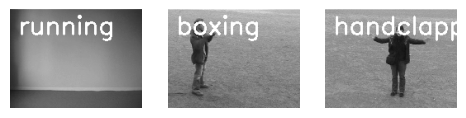

In [4]:
# according to ypur pc
import os
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# Set the path to your dataset folder
dataset_path = '/content/drive/MyDrive/GRU/train'

# Create a figure for displaying the images
plt.figure(figsize=(20, 20))  # Canvas size in inches

# List all class folders
all_classes_names = os.listdir(dataset_path)

for counter, selected_class_name in enumerate(all_classes_names, 1):
    # List all video files in the current class folder
    video_files_names_list = os.listdir(os.path.join(dataset_path, selected_class_name))

    # Check if there are video files in the folder
    if video_files_names_list:
        # Randomly select a video
        selected_video_file_name = random.choice(video_files_names_list)
        video_path = os.path.join(dataset_path, selected_class_name, selected_video_file_name)

        # Read the video
        video_reader = cv2.VideoCapture(video_path)
        _, bgr_frame = video_reader.read()
        video_reader.release()

        # Convert frame to RGB
        if bgr_frame is not None:
            rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
            # Add class name to the frame
            cv2.putText(rgb_frame, selected_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Display the frame in the subplot
            plt.subplot(5, 10, counter)
            plt.imshow(rgb_frame)
            plt.axis('off')
        else:
            print(f"Could not read a frame from {selected_video_file_name} in {selected_class_name}")
    else:
        print(f"No video files found in folder {selected_class_name}")

plt.show()


In [5]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 25
DATASET_DIR = '/content/drive/MyDrive/GRU/train'
CLASSES_LIST = ['boxing', 'handclapping','running']


# VIDEO PREPROCESSING

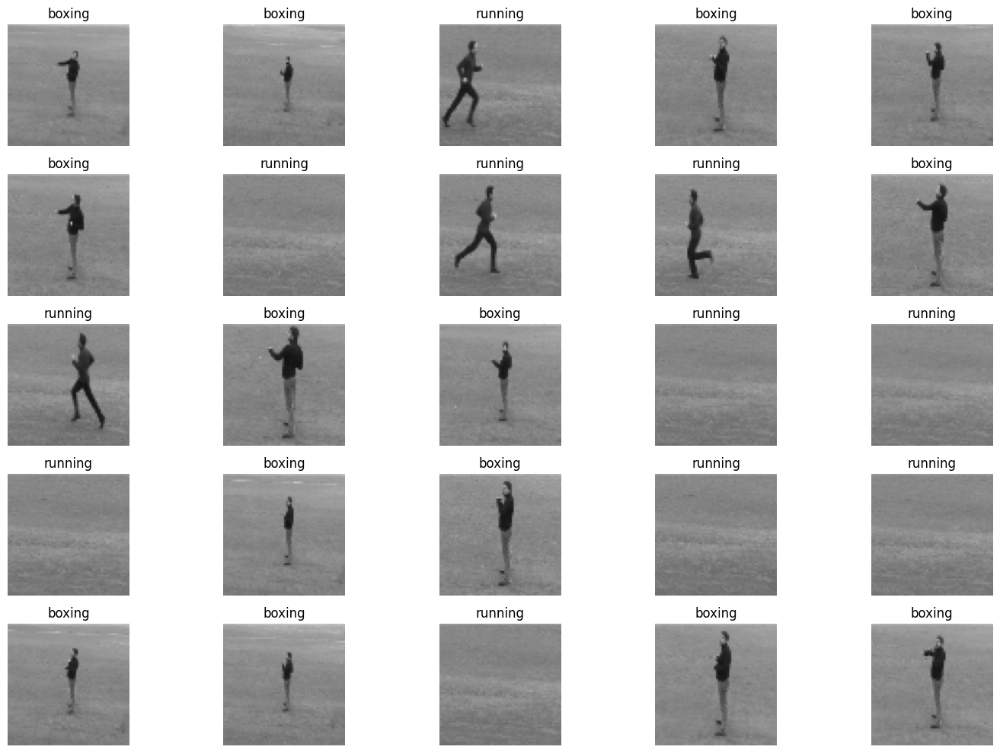

In [6]:
IMAGE_HEIGHT,IMAGE_WIDTH = 64,64
SEQUENCE_LENGTH = 25

def frames_extraction(video_path):
  frames_list=[]
  video_reader = cv2.VideoCapture(video_path)
  video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
  skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1) #default skip is 1
  for frame_counter in range(SEQUENCE_LENGTH):
    video_reader.set(cv2.CAP_PROP_POS_FRAMES,frame_counter*skip_frames_window)
    success,frame = video_reader.read()
    if not success:
      break

    resized_frame = cv2.resize(frame,(IMAGE_HEIGHT,IMAGE_WIDTH))
    normalized_frame = resized_frame / 255 #color 0-255
    frames_list.append(normalized_frame)
  video_reader.release()

  return frames_list
# fc=frames_extraction('/content/drive/MyDrive/GRU/train/running/person01_running_d1_uncomp.avi')
# len(fc)

video_paths = {
    'running': '/content/drive/MyDrive/GRU/train/running/person01_running_d1_uncomp.avi',
    'boxing': '/content/drive/MyDrive/GRU/train/boxing/person02_boxing_d2_uncomp.avi',
    'handwaving': '/content/drive/MyDrive/GRU/train/handwaving/person03_handwaving_d3_uncomp.avi'
}

# Extract frames for each class
frames_data = {}
for class_name, video_path in video_paths.items():
    frames_data[class_name] = frames_extraction(video_path)

# Combine frames from all classes
all_frames = []
all_labels = []
for class_name, frames_list in frames_data.items():
    all_frames.extend(frames_list)
    all_labels.extend([class_name] * len(frames_list))

# Randomly select 25 frames for visualization
random_indices = random.sample(range(len(all_frames)), 25)
selected_frames = [all_frames[i] for i in random_indices]
selected_labels = [all_labels[i] for i in random_indices]

# Visualize the selected frames
plt.figure(figsize=(15, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(selected_frames[i])
    plt.title(selected_labels[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

In [7]:
print(os.listdir('/content/drive/MyDrive/GRU/train/handclapping'))


['person01_handclapping_d1_uncomp.avi', 'person01_handclapping_d4_uncomp.avi', 'person02_handclapping_d1_uncomp.avi', 'person01_handclapping_d2_uncomp.avi', 'person01_handclapping_d3_uncomp.avi', 'person06_handclapping_d1_uncomp.avi', 'person03_handclapping_d1_uncomp.avi', 'person05_handclapping_d3_uncomp.avi', 'person02_handclapping_d3_uncomp.avi', 'person03_handclapping_d4_uncomp.avi', 'person04_handclapping_d3_uncomp.avi', 'person04_handclapping_d4_uncomp.avi', 'person07_handclapping_d1_uncomp.avi', 'person07_handclapping_d3_uncomp.avi', 'person03_handclapping_d3_uncomp.avi', 'person04_handclapping_d1_uncomp.avi', 'person07_handclapping_d2_uncomp.avi', 'person02_handclapping_d2_uncomp.avi', 'person05_handclapping_d1_uncomp.avi', 'person06_handclapping_d2_uncomp.avi', 'person03_handclapping_d2_uncomp.avi', 'person05_handclapping_d4_uncomp.avi', 'person02_handclapping_d4_uncomp.avi', 'person04_handclapping_d2_uncomp.avi', 'person05_handclapping_d2_uncomp.avi', 'person06_handclapping_d

In [8]:
def create_dataset():
  features = []
  labels = []
  video_files_paths = []
  for class_index,class_name in enumerate(CLASSES_LIST):
    print(f'Extracting Data of CLass: {class_name}')

    files_list = os.listdir(os.path.join(DATASET_DIR,class_name))
    for file_name in files_list:
      video_file_path = os.path.join(DATASET_DIR,class_name,file_name)

      frames = frames_extraction(video_file_path)
      if len(frames) == SEQUENCE_LENGTH:
        features.append(frames)
        labels.append(class_index)
        video_files_paths.append(video_file_path)
  features = np.asarray(features)
  labels = np.array(labels)

  return features,labels,video_files_paths



# FEATURE EXTRACTION

In [9]:
features,labels,video_files_paths = create_dataset()


Extracting Data of CLass: boxing
Extracting Data of CLass: handclapping
Extracting Data of CLass: running


# SPLITTING DATA FOR TRAIN TEST

In [10]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [11]:
one_hot_encoded_labels = to_categorical(labels)

In [12]:
features_train,features_test,labels_train,lables_test = train_test_split(features,one_hot_encoded_labels,
                                                                         test_size = 0.25,shuffle = True,
                                                                         random_state = seed_constant)

# CNN-LSTM MODEL LAYERS

In [13]:
def create_LRCN_model():


    model = Sequential()

    #Model Architecture.
    #---------------------------------------------------------------------------------------------------------------------------------------------------#

    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.5)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.5)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.5)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))

    #K-LAYERED LSTM K=1
    model.add(LSTM(32))

    model.add(Dense(len(CLASSES_LIST[:10]), activation = 'softmax'))

    #------------------------------------------------------------------------------------------------------------------------------------------------#

    model.summary()


    return model



In [14]:

LRCN_model = create_LRCN_model()


print("Model Created Successfully!")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed (TimeDistributed)   │ (None, 25, 64, 64, 16)      │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 25, 16, 16, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 25, 16, 16, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 25, 16, 16, 32)      │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 25, 4, 4, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 25, 4, 4, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_6 (TimeDistributed) │ (None, 25, 4, 4, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_7 (TimeDistributed) │ (None, 25, 2, 2, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_8 (TimeDistributed) │ (None, 25, 2, 2, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_9 (TimeDistributed) │ (None, 25, 2, 2, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_10                  │ (None, 25, 1, 1, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_11                  │ (None, 25, 1, 1, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_12                  │ (None, 25, 64)              │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 3)                   │              99 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,027 (285.26 KB)

 Trainable params: 73,027 (285.26 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


In [15]:
def plot_metric(model_training_history,metric_name1,metric_name2,plot_name):
  metric_value1 = model_training_history.history[metric_name1]
  metric_value2 = model_training_history.history[metric_name2]

  epochs = range(len(metric_value1))

  plt.plot(epochs,metric_value1,'blue',label=metric_name1)
  plt.plot(epochs,metric_value2,'red',label=metric_name2)
  plt.title(str(plot_name))

  plt.legend()

# MODEL TRAINING

In [16]:
import time

# before training
start_time = time.time()

early_stopping_callback = EarlyStopping(monitor='accuracy', patience=10, mode='max', restore_best_weights=True)

LRCN_model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=["accuracy"])

# Start training
LRCN_model_training_history = LRCN_model.fit(x=features_train, y=labels_train, epochs=100, batch_size=4,
                                             shuffle=True, validation_split=0.2, callbacks=[early_stopping_callback])

# end time after training
end_time = time.time()

# total training time
total_training_time = end_time - start_time
print(f"Total training time: {total_training_time:.2f} seconds")


Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - accuracy: 0.3274 - loss: 1.1464 - val_accuracy: 0.4000 - val_loss: 1.1069
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2977 - loss: 1.1254 - val_accuracy: 0.4000 - val_loss: 1.0968
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - accuracy: 0.3019 - loss: 1.1093 - val_accuracy: 0.2444 - val_loss: 1.1068
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.3618 - loss: 1.0937 - val_accuracy: 0.2222 - val_loss: 1.1180
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.3827 - loss: 1.0997 - val_accuracy: 0.2222 - val_loss: 1.0911
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - accuracy: 0.5493 - loss: 1.0196 - val_accuracy: 0.6000 - val_loss: 0.6373
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - accuracy: 0.6072 - loss: 0.6910 - val_accuracy: 0.6222 - val_loss: 0.5607
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6609 - loss: 0.5405 - val_accuracy: 

In [17]:
model_evaluation_history = LRCN_model.evaluate(features_test,lables_test)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.9209 - loss: 0.2747


# MODEL PLOT VISUALISATION

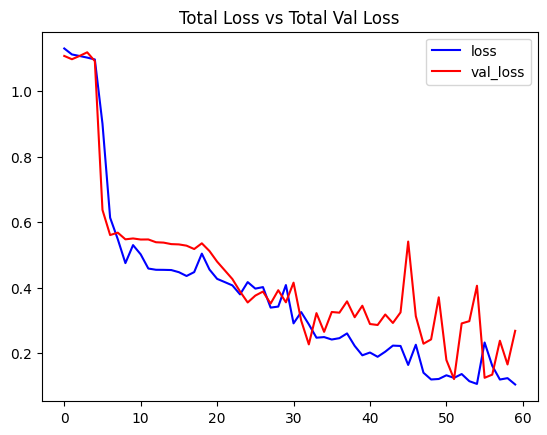

In [18]:
plot_metric(LRCN_model_training_history,'loss','val_loss','Total Loss vs Total Val Loss')

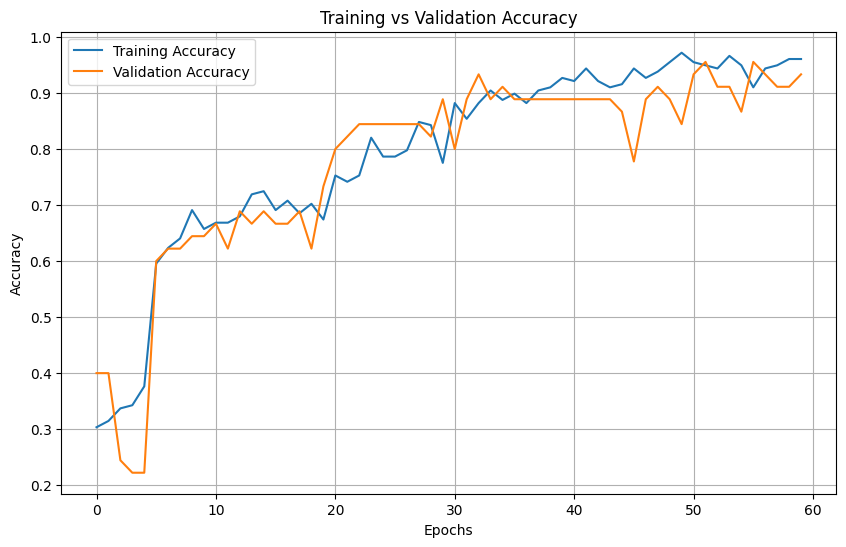

In [19]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(10, 6))
plt.plot(LRCN_model_training_history.history['accuracy'], label='Training Accuracy')
plt.plot(LRCN_model_training_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [20]:
!pip install moviepy

# MODEL LOADING FOR PREDICTION

In [21]:
import os
from tensorflow.keras.models import load_model

# Define the directory where you want to save the model
model_dir = '/content/drive/MyDrive/GRU'

# Ensure the directory exists
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
    print(f"Created directory: {model_dir}")

# Save the model
model_save_path = os.path.join(model_dir, 'model.h5')
LRCN_model.save(model_save_path)
print(f"Model saved at {model_save_path}")

# To load the saved model
loaded_model = load_model(model_save_path)
print("Model loaded successfully!")


Model saved at /content/drive/MyDrive/GRU/model.h5
Model loaded successfully!


In [22]:
# Function to preprocess a video for prediction
def preprocess_video(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)

    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        frame_position = frame_counter * skip_frames_window
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_position)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0  # Normalize to [0, 1]
        frames_list.append(normalized_frame)

    video_reader.release()

    # Ensure we have exactly SEQUENCE_LENGTH frames
    if len(frames_list) == SEQUENCE_LENGTH:
        return np.array(frames_list)
    else:
        return None


In [23]:
# Loading the model
MODEL_PATH = '/content/drive/MyDrive/GRU/model.h5'
model = load_model(MODEL_PATH)

# Recompile the model (optional if you plan to train further)
model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=["accuracy"])

# Now you're ready to use the model for predictions
print("Model loaded and compiled successfully!")


Model loaded and compiled successfully!


# PREDICTION ON TEST VIDEOS

In [24]:
# Predict on test videos
def predict_on_test_videos():
    print("Predicting on test videos...")
    results = []

    TEST_DATASET_DIR = '/content/drive/MyDrive/GRU/test'

    for class_name in os.listdir(TEST_DATASET_DIR):
        class_dir = os.path.join(TEST_DATASET_DIR, class_name)

        if not os.path.isdir(class_dir):
            continue

        for video_name in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_name)
            print(f"Processing video: {video_name} from class: {class_name}")

            # Preprocess the video
            preprocessed_frames = preprocess_video(video_path)
            if preprocessed_frames is None:
                print(f"Skipping {video_name}: Not enough frames for prediction")
                continue

            # Add batch dimension (the model expects a batch of sequences)
            preprocessed_frames = np.expand_dims(preprocessed_frames, axis=0)

            # Make predictions
            predictions = model.predict(preprocessed_frames)
            predicted_class_index = np.argmax(predictions[0])  # Get index of the highest predicted class
            predicted_class_name = CLASSES_LIST[predicted_class_index]

            # Save the result
            results.append((video_name, class_name, predicted_class_name))
            print(f"Predicted Class: {predicted_class_name} | Actual Class: {class_name}")

    # Return results for evaluation or analysis
    return results

# Run the prediction on test videos
results = predict_on_test_videos()

# Optional: Print a summary of results
print("\nSummary of Predictions:")
for video_name, actual_class, predicted_class in results:
    print(f"Video: {video_name} | Actual: {actual_class} | Predicted: {predicted_class}")


Predicting on test videos...
Processing video: person01_boxing_d3_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted Class: handclapping | Actual Class: running
Processing video: person01_boxing_d2_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: boxing | Actual Class: running
Processing video: person01_boxing_d1_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted Class: boxing | Actual Class: running
Processing video: person02_handclapping_d1_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted Class: handclapping | Actual Class: running
Processing video: person01_handclapping_d4_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: handclapping | Actual Class: running
Processing video: person01_handwaving_d1_uncomp.avi from class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: handclapping | Actual Class: boxing
Processing 

In [25]:
import os
import random
import cv2
import numpy as np
from IPython.display import Video, display

# Define the constants and model
CLASSES_LIST = ['boxing','handclapping','running']
TEST_DATASET_DIR = '/content/drive/MyDrive/GRU/test'

# Function to preprocess video
def preprocess_video(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    video_reader.release()

    if len(frames_list) < SEQUENCE_LENGTH:
        return None  # Not enough frames
    return np.array(frames_list)

# Function to predict on 5 random videos
def predict_on_random_videos():
    print("Predicting on 5 random videos...")

    # Get all videos from the test dataset
    all_videos = []
    for class_name in os.listdir(TEST_DATASET_DIR):
        class_dir = os.path.join(TEST_DATASET_DIR, class_name)
        if not os.path.isdir(class_dir):
            continue
        for video_name in os.listdir(class_dir):
            all_videos.append((class_name, os.path.join(class_dir, video_name)))

    # Randomly select 5 videos
    selected_videos = random.sample(all_videos, 5)

    # Predict on each video
    for idx, (actual_class, video_path) in enumerate(selected_videos):
        print(f"\nVideo {idx + 1}: {os.path.basename(video_path)} | Actual Class: {actual_class}")

        # Preprocess the video
        preprocessed_frames = preprocess_video(video_path)
        if preprocessed_frames is None:
            print(f"Skipping {os.path.basename(video_path)}: Not enough frames for prediction")
            continue

        # Add batch dimension
        preprocessed_frames = np.expand_dims(preprocessed_frames, axis=0)

        # Make predictions
        predictions = model.predict(preprocessed_frames)
        predicted_class_index = np.argmax(predictions[0])
        predicted_class_name = CLASSES_LIST[predicted_class_index]
        print(f"Predicted Class: {predicted_class_name}")

        # Display the video
        print("Displaying the video below:")
        display(Video(video_path, embed=True))

# Run the prediction process
predict_on_random_videos()


Predicting on 5 random videos...

Video 1: person01_boxing_d3_uncomp.avi | Actual Class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Predicted Class: handclapping
Displaying the video below:



Video 2: person01_running_d2_uncomp.avi | Actual Class: handclapping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted Class: running
Displaying the video below:



Video 3: person01_jogging_d3_uncomp.avi | Actual Class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: running
Displaying the video below:



Video 4: person01_handwaving_d1_uncomp.avi | Actual Class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Class: handclapping
Displaying the video below:



Video 5: person01_walking_d1_uncomp.avi | Actual Class: handclapping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted Class: running
Displaying the video below:


# MODEL EVALUATION

In [26]:
# Optional: Print a summary of results
print("\nSummary of Predictions:")
for video_name, actual_class, predicted_class in results:
    print(f"Video: {video_name} | Actual: {actual_class} | Predicted: {predicted_class}")


Summary of Predictions:
Video: person01_boxing_d3_uncomp.avi | Actual: running | Predicted: handclapping
Video: person01_boxing_d2_uncomp.avi | Actual: running | Predicted: boxing
Video: person01_boxing_d1_uncomp.avi | Actual: running | Predicted: boxing
Video: person02_handclapping_d1_uncomp.avi | Actual: running | Predicted: handclapping
Video: person01_handclapping_d4_uncomp.avi | Actual: running | Predicted: handclapping
Video: person01_handwaving_d1_uncomp.avi | Actual: boxing | Predicted: handclapping
Video: person01_jogging_d1_uncomp.avi | Actual: boxing | Predicted: running
Video: person01_jogging_d3_uncomp.avi | Actual: boxing | Predicted: running
Video: person01_jogging_d2_uncomp.avi | Actual: boxing | Predicted: running
Video: person01_running_d3_uncomp.avi | Actual: boxing | Predicted: running
Video: person01_running_d2_uncomp.avi | Actual: handclapping | Predicted: running
Video: person01_running_d1_uncomp.avi | Actual: handclapping | Predicted: running
Video: person01_wa

# CLASSIFICATION REPORT

Evaluating model metrics...
Processing video: person01_boxing_d3_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Processing video: person01_boxing_d2_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Processing video: person01_boxing_d1_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Processing video: person02_handclapping_d1_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Processing video: person01_handclapping_d4_uncomp.avi from class: running
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Processing video: person01_handwaving_d1_uncomp.avi from class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Processing video: person01_jogging_d1_uncomp.avi from class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Processing video: person01_jogging_d3_uncomp.avi from class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Processing video: person01_jogging_d2_uncomp.avi from class: boxing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Pro

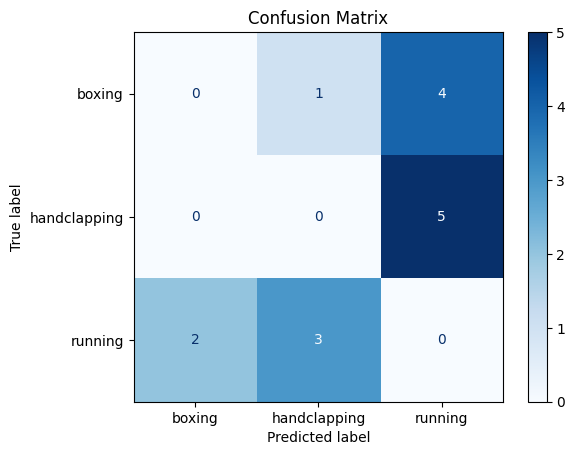


Classification Report:
              precision    recall  f1-score   support

      boxing       0.00      0.00      0.00       5.0
handclapping       0.00      0.00      0.00       5.0
     running       0.00      0.00      0.00       5.0

    accuracy                           0.00      15.0
   macro avg       0.00      0.00      0.00      15.0
weighted avg       0.00      0.00      0.00      15.0



In [28]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np

# Function to evaluate the model
def evaluate_model_metrics():
    print("Evaluating model metrics...")

    true_labels = []
    predicted_labels = []

    for class_name in os.listdir(TEST_DATASET_DIR):
        class_dir = os.path.join(TEST_DATASET_DIR, class_name)

        if not os.path.isdir(class_dir):
            continue

        for video_name in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_name)
            print(f"Processing video: {video_name} from class: {class_name}")

            # Preprocess the video
            preprocessed_frames = preprocess_video(video_path)
            if preprocessed_frames is None:
                print(f"Skipping {video_name}: Not enough frames for prediction")
                continue

            # Add batch dimension (the model expects a batch of sequences)
            preprocessed_frames = np.expand_dims(preprocessed_frames, axis=0)

            # Make predictions
            predictions = model.predict(preprocessed_frames)
            predicted_class_index = np.argmax(predictions[0])  # Get index of the highest predicted class

            # Append the true and predicted labels
            true_labels.append(CLASSES_LIST.index(class_name))
            predicted_labels.append(predicted_class_index)

    # Create and print confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    print("\nConfusion Matrix:")
    print(cm)

    # Display confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASSES_LIST)
    disp.plot(cmap='Blues', values_format='d')
    plt.title("Confusion Matrix")
    plt.show()

    # Calculate and display classification metrics
    print("\nClassification Report:")
    report = classification_report(true_labels, predicted_labels, target_names=CLASSES_LIST)
    print(report)

# Run the function
evaluate_model_metrics()
